In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from dataprep.eda import *
from dataprep.eda.missing import plot_missing
from dataprep.eda import plot_correlation

In [30]:
try:
    data = pd.read_csv("D:/codes/ITI/libariies/final project/data.csv", encoding='latin1', low_memory=False)
except UnicodeDecodeError as e:
    print(f"Encoding error: {e}")

In [34]:
data.head(3)

,Unnamed: 0,eventid,iyear,imonth,iday,country_txt,region_txt,provstate,city,attacktype1_txt,nkill,nwound,target1,summary,gname,targtype1_txt,weaptype1_txt,motive,success
0,0,197000000002,1970,0,0,Mexico,North America,Federal,Mexico city,Hostage Taking (Kidnapping),0,0,"Nadine Chaval, daughter","09/00/2016: Sometime between September 18, 201...",23rd of September Communist League,Government (Diplomatic),Unknown,Unknown,1
1,1,197001000001,1970,1,0,Philippines,Southeast Asia,Tarlac,Unknown,Assassination,1,0,Employee,"09/00/2016: Sometime between September 18, 201...",Unknown,Journalists & Media,Unknown,Unknown,1
2,2,197001000002,1970,1,0,Greece,Western Europe,Attica,Athens,Bombing/Explosion,2,3,U.S. Embassy,"09/00/2016: Sometime between September 18, 201...",Unknown,Government (Diplomatic),Explosives,Unknown,1


In [35]:
rows, columns = data.shape
print(f"no of rows : {rows}")
print(f"no of columns : {columns}")

no of rows : 180204
no of columns : 19


# Data Analysis

##### 1- Calculate the mean, median, and standard deviation of relevant numeric columns.

In [24]:
for i in data.select_dtypes('number').columns:
    print(i)    

eventid
iyear
imonth
iday
nkill
nwound
success


In [25]:
print(f"nkill_mean = {np.mean(data['nkill'])}")
print(f"nkill_median = {np.median(data['nkill'])}")
print(f"nkill_std = {np.std(data['nkill'])}")

print('----------------------------------')

print(f"nwound_mean = {np.mean(data['nwound'])}")
print(f"nwound_median = {np.median(data['nwound'])}")
print(f"nwound_std = {np.std(data['nwound'])}")


#print(data.groupby(['Date'], as_index=False).max())

nkill_mean = 2.3811838607823224
nkill_median = 1.0
nkill_std = 11.240006377360531
----------------------------------
nwound_mean = 3.158950540212089
nwound_median = 0.0
nwound_std = 34.42633764583603


##### 2- Identify the most frequent values in categorical columns.

In [26]:
#data['success'].value_counts().sort_values(ascending=False).head(1)
print(f"most frequent value in regon : {data['region_txt'].value_counts().idxmax()}")
print(f"most frequent value in country : {data['country_txt'].value_counts().idxmax()}")
print(f"most frequent value in state : {data['provstate'].value_counts().idxmax()}")
print(f"most frequent value in weapon type : {data['weaptype1_txt'].value_counts().idxmax()}")
print(f"most frequent value in attack type : {data['attacktype1_txt'].value_counts().idxmax()}")
print(f"most frequent value in target type : {data['targtype1_txt'].value_counts().idxmax()}")

'''
most_frequent_values = data['provstate'].value_counts()
# To get the top most frequent value(s)
top_frequent_value = most_frequent_values.idxmax()  # idxmax() gives the index (value) with the highest count
top_frequent_count = most_frequent_values.max()  # max() gives the highest count
print("Most frequent value:", top_frequent_value)
print("Count:", top_frequent_count)
'''

most frequent value in regon : Middle East & North Africa
most frequent value in country : Iraq
most frequent value in state : Baghdad
most frequent value in weapon type : Explosives
most frequent value in attack type : Bombing/Explosion
most frequent value in target type : Private Citizens & Property


'\nmost_frequent_values = data[\'provstate\'].value_counts()\n# To get the top most frequent value(s)\ntop_frequent_value = most_frequent_values.idxmax()  # idxmax() gives the index (value) with the highest count\ntop_frequent_count = most_frequent_values.max()  # max() gives the highest count\nprint("Most frequent value:", top_frequent_value)\nprint("Count:", top_frequent_count)\n'

##### Group data by various categories (e.g., year, region, attack type) and calculate aggregate statistics


In [78]:
print('total killings in each country')
data.groupby("country_txt")["nkill"].sum().reset_index(name='total killings').head()

print('total killings in each region')
data.groupby("region_txt")["nkill"].sum().reset_index(name='total killings').head()

print('total killings in each year')
data.groupby("iyear")["nkill"].sum().reset_index(name='total killings').head()

print('total killings by each group name')
data.groupby("gname")["nkill"].sum().reset_index(name='total killings').head()

print('total killings in each city')
data.groupby("city")["nkill"].sum().reset_index(name='total killings').head()

print('numner of each attack type')
data.groupby('attacktype1_txt').size().reset_index(name="total")

print('number of each used weapon type')
data.groupby('weaptype1_txt').size().reset_index(name="total")

print('total number of each target')
data.groupby('targtype1_txt').size().reset_index(name="total")

print('total number of killings and wounded in each city')
data.groupby("city")['nkill','nwound'].sum().reset_index().head()

print('total number of killings and wounded in each year')
data.groupby("iyear")['nkill','nwound'].sum().reset_index().head()

print("this a pivot table to show the weapon type in each region")
weapon_pivot = data.pivot_table(index="region_txt", columns="weaptype1_txt", values="eventid", aggfunc="count", fill_value=0)
weapon_pivot.head()

this a pivot table to show the weapon type in each region


weaptype1_txt,Biological,Chemical,Explosives,Fake Weapons,Firearms,Incendiary,Melee,Other,Radiological,Sabotage Equipment,Unknown,"Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)"
region_txt,,,,,,,,,,,,
Australasia & Oceania,0,11,74,0,68,69,9,1,0,0,26,1
Central America & Caribbean,0,2,3089,0,5581,427,64,0,0,5,985,4
Central Asia,0,2,247,1,222,15,13,0,0,0,44,0
East Asia,2,17,320,4,35,240,78,3,10,3,44,8
Eastern Europe,0,12,3040,4,1425,183,90,4,0,4,287,1


##### Identify trends over time (e.g., number of attacks per year).

In [95]:
print("the 5 top years of the high number of attack ")
data.groupby("iyear")['attacktype1_txt'].count().sort_values(ascending=False).reset_index(name='number of attack type').head(5)

print("the 5 top years of highest number of killings ")
data.groupby("iyear")['nkill'].count().nlargest(5).reset_index(name='number of attack type')

print("the 5 top years of highest number of wounded ")
data.groupby("iyear")['nwound'].count().nlargest(5).reset_index(name='number of wounded')

the 5 top years of the high number of attack 


,iyear,number of attack type
0,2014,16903
1,2015,14965
2,2016,13587
3,2013,12036
4,2017,10898


#### Determine the most affected regions and countries

In [41]:
print("the most affected regions by the terrorism")
data.groupby('region_txt').size().sort_values(ascending=False).reset_index().head(5)


the most affected regions by the terrorism


,region_txt,0
0,Middle East & North Africa,50249
1,South Asia,44710
2,South America,18910
3,Sub-Saharan Africa,17519
4,Western Europe,16511


In [42]:
print("the most affected countries by the terrorism")
data.groupby('country_txt').size().nlargest(5).reset_index()

the most affected countries by the terrorism


,country_txt,0
0,Iraq,24578
1,Pakistan,14337
2,Afghanistan,12578
3,India,11918
4,Colombia,8289


##### Identify the most common attack types and targets

In [43]:
print("the most common attack types")
data.groupby("attacktype1_txt").size().sort_values(ascending=False).reset_index().head(5)

the most common types


,attacktype1_txt,0
0,Bombing/Explosion,87648
1,Armed Assault,42239
2,Assassination,19164
3,Hostage Taking (Kidnapping),11094
4,Facility/Infrastructure Attack,10278


In [45]:
print("the most common targets types")
data.groupby("target1").size().sort_values(ascending=False).reset_index().head(5)

the most common targets types


,target1,0
0,Civilians,6441
1,Unknown,5881
2,Soldiers,3156
3,Patrol,2941
4,Checkpoint,2905


    -------------------------------------------------------------------------------------------------------------------------

### Data Visualization

    1- Line plot showing the trend of terrorist attacks over the years

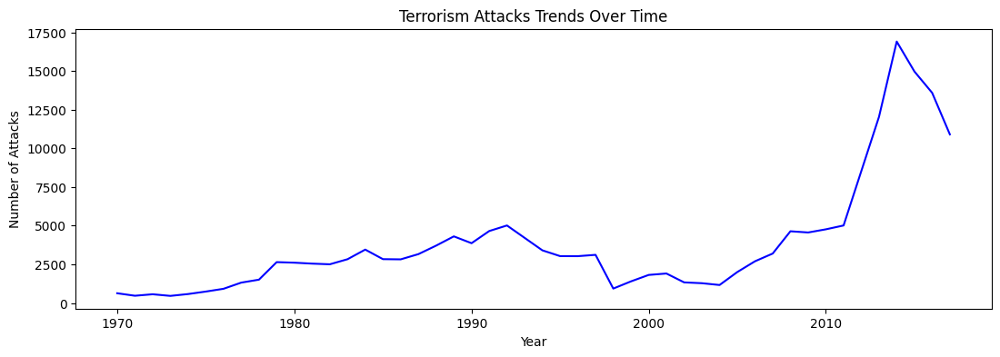

In [26]:

year_attacks = data.groupby('iyear').size().reset_index(name='count')
plt.figure(figsize=(13, 4))
sns.lineplot(x='iyear', y='count', data = year_attacks, color='blue')
plt.xlabel('Year')
plt.ylabel('Number of Attacks')
plt.title("Terrorism Attacks Trends Over Time")
plt.show()

    2- Bar plot of the number of attacks by region

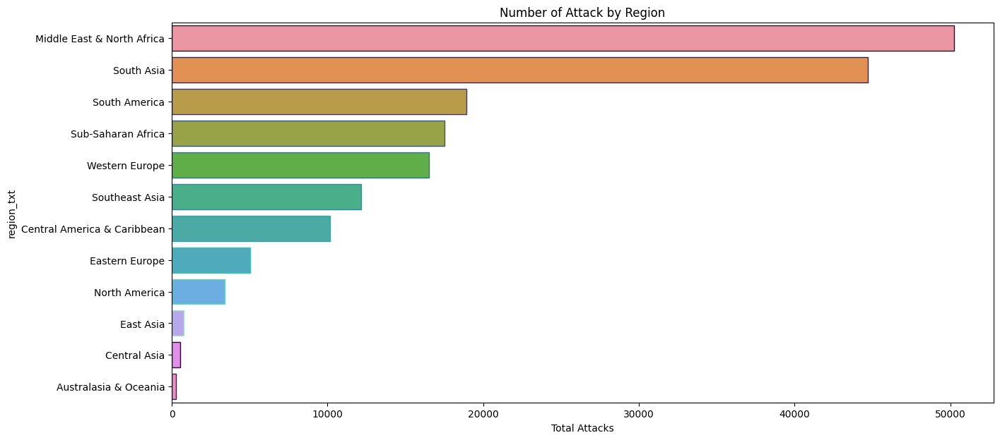

In [41]:
region= data.groupby('region_txt').size().sort_values(ascending=False).reset_index()
region.columns = ['region_txt', 'Total Attacks']
plt.subplots(figsize=(15,7))
sns.barplot(x=region['Total Attacks'], y=region.region_txt, edgecolor=sns.color_palette('mako',10),orient='h')
plt.title('Number of Attack by Region')
plt.show()

    3- Bar plot of the number of attacks by country.

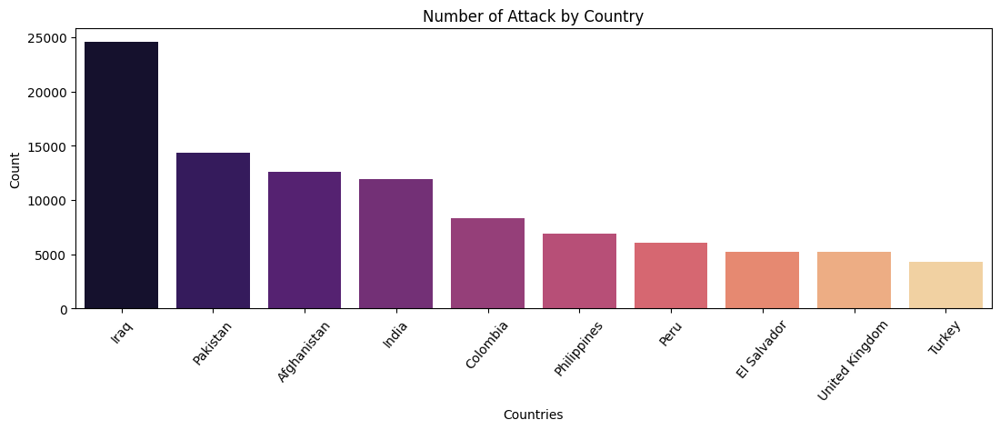

In [27]:
plt.subplots(figsize=(13,4))
Most_country = data.groupby('country_txt').size().nlargest(10).reset_index()
Most_country.columns= ['country_txt','Attacks_Counts']
sns.barplot(x='country_txt',y='Attacks_Counts', data = Most_country, palette='magma')
plt.title('Number of Attack by Country')
plt.xlabel('Countries')
plt.ylabel('Count')
plt.xticks(rotation=50)
plt.show()

    3- Heatmap to visualize the correlation between diSerent features

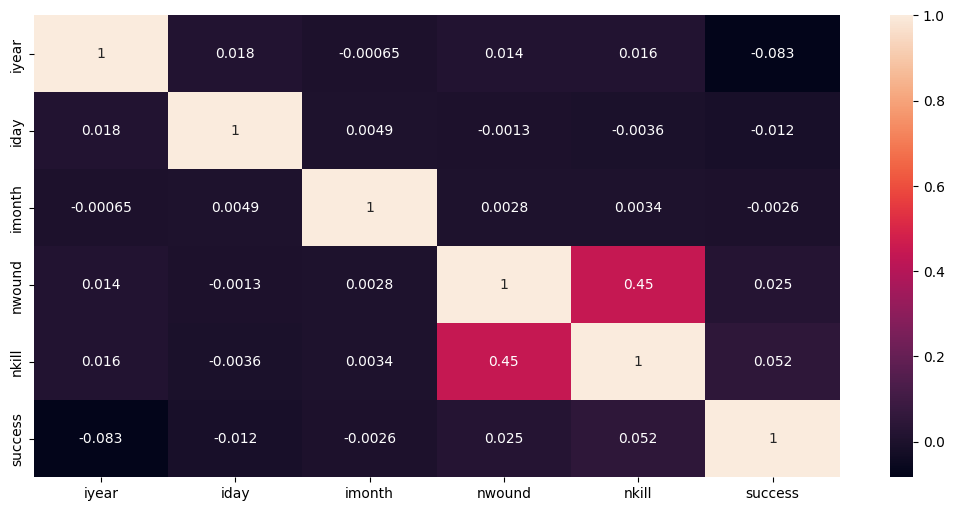

In [40]:
sns.heatmap(data[['iyear','iday','imonth','nwound','nkill','success']].corr(),annot=True)
plt.rcParams['figure.figsize']=(15,6)

    4- Scatter plot showing the relationship between the number of casualties and the type of attack.

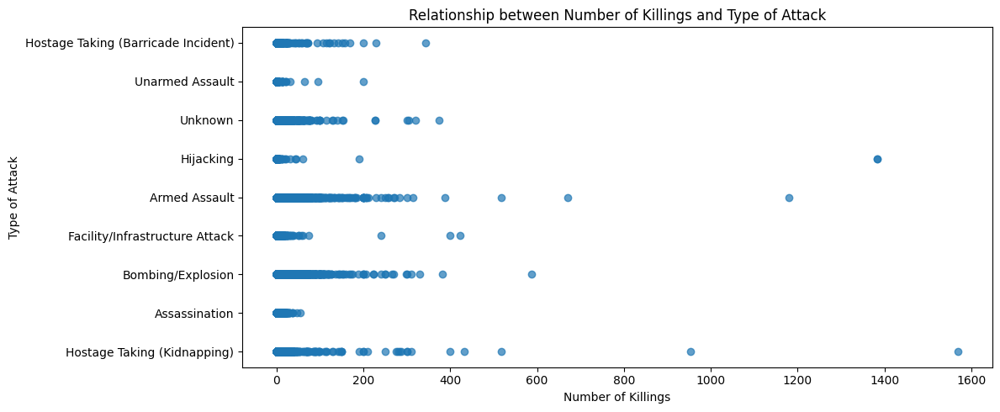

In [37]:
plt.figure(figsize=(12, 5))  

plt.scatter(data['nkill'], data['attacktype1_txt'], alpha=0.7)
plt.xlabel('Number of Killings')
plt.ylabel('Type of Attack')
plt.title('Relationship between Number of Killings and Type of Attack')
plt.tight_layout()

plt.show()

#### Create interactive visualizations using Plotly (optional for advanced students)
     
     
     1- Interactive map to show the geographic distribution of attacks.

In [47]:
country_map = data.groupby("country_txt")['attacktype1_txt'].count().reset_index()

fig = px.choropleth(country_map,locations='country_txt',locationmode='country names', color='attacktype1_txt',
                    title='Geographic distributoin of attacks',
                    labels={'attacktype1_txt': 'Number of Attacks'},
                    hover_name='country_txt',color_continuous_scale='YlOrRd'
                    )
fig.show()

    2- Time series animation showing the spread of terrorism over the years

In [28]:
fig = px.choropleth(data, locations='country_txt',  locationmode='country names',color = 'attacktype1_txt',
                    title='Spread of terrorism over the years', animation_frame='iyear',animation_group="country_txt")
# Display the map
fig.show()

    ----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

# Demonstrate how to use Dask and Compare the performance and memory usage of Dask operations with Pandas.

In [2]:
import dask.dataframe as dd
from dask.distributed import Client
import time
import memory_profiler
import warnings
warnings.filterwarnings('ignore')

In [45]:
# Define a function to calculate the time consuming and memory usage of Pandas operation
# first use the function in data reading operation 

def calculate():
    
    mem_usage_before = memory_profiler.memory_usage()[0] # Measure memory usage
    
    start_time = time.time() # Measure time
    
    try:
        data = pd.read_csv("D:\codes/ITI/libariies/final project/globalterrorismdb_0718dist.csv", encoding='latin1', low_memory=False)
    except UnicodeDecodeError as e:
        print(f"Encoding error: {e}")
    
    mem_usage_after = memory_profiler.memory_usage()[0] # Measure memory usage after reading data
    
    end_time = time.time() 
    
    print(f"Pandas Memory Usage: {mem_usage_after - mem_usage_before} MB")
    print(f"Pandas Time consuming: {end_time - start_time} seconds")


calculate()

Pandas Memory Usage: 264.765625 MB
Pandas Time consuming: 4.715858697891235 seconds


In [46]:
# use the function to calculate the read operation with Dask 

def calculate():
    
    mem_usage_before = memory_profiler.memory_usage()[0]
    
    start_time = time.time()
    
    try:
        ddf = dd.read_csv("D:\codes/ITI/libariies/final project/globalterrorismdb_0718dist.csv", encoding='latin1', low_memory=False)
    except UnicodeDecodeError as e:
        print(f"Encoding error: {e}")
    
        
    mem_usage_after = memory_profiler.memory_usage()[0]
    
    end_time = time.time()
        
    print(f"Dask Memory Usage: {mem_usage_after - mem_usage_before} MB")
    print(f"Dask Time consuming: {end_time - start_time} seconds")
    
    
calculate()

Dask Memory Usage: 0.00390625 MB
Dask Elapsed Time: 0.12504029273986816 seconds


    - Perform some operations with Pandas & Dask 
    - Use function calculte to Compare the performance between Pandas & Dask.

In [65]:
# perform some operations with pandas

def calculate():
    
    start_time = time.time()
    
    Most_country = data.groupby('country_txt').size().nlargest(10).reset_index()
    
    most_city = data.groupby("city")['nkill','nwound'].sum().reset_index().head()

    years = data.groupby("iyear")['nkill','nwound'].sum().reset_index().head()
    
    num_killings = data.groupby("iyear")['nkill'].count().nlargest(5).reset_index(name='number of attack type')

    num_wounded = data.groupby("iyear")['nwound'].count().nlargest(5).reset_index(name='number of wounded')
    
    end_time = time.time()
        
    print(f"Pandas Time consuming: {end_time - start_time} seconds")
    
    
calculate()


Pandas Time consuming: 0.12469291687011719 seconds


In [63]:
# perform some operations with Dask

def calculate_mean_with_dask():
    
    ddf=dd.from_pandas(data,npartitions=3)
    
    start_time = time.time()
    
    Most_country = ddf.groupby('country_txt').size().nlargest(10).reset_index()
    
    most_city = ddf.groupby("city")['nkill','nwound'].sum().reset_index().head()

    years = ddf.groupby("iyear")['nkill','nwound'].sum().reset_index().head()

    num_killings = data.groupby("iyear")['nkill'].count().nlargest(5).reset_index(name='number of attack type')

    num_wounded = data.groupby("iyear")['nwound'].count().nlargest(5).reset_index(name='number of wounded')    
    
    end_time = time.time()
        
    print(f"Dask Time consuming: {end_time - start_time} seconds")
    

calculate()

Dask Time consuming: 0.1174476146697998 seconds
